## Methodology

Our previous notebook gathered our data.  Now let's analyze it. 



In [1]:
import numpy as np
import pandas as pd
from project_lib import Project
!pip install folium
import folium
import pickle
from sklearn.cluster import DBSCAN 
import math
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import random
from geopy.distance import distance

DF_PATH = "df.pickle"

     |████████████████████████████████| 92kB 9.7MB/s  eta 0:00:01


The hidden cell below looks like  
`PROJECT_ID=<My Project ID>`  
`PROJECT_ACCESS_TOKEN=<My Project Access Token>`  
with `<My Project ID>` and `<My Project Access Token>` replaced with my Watson Studio project's ID and it's access token repectively. 

In [2]:
# The code was removed by Watson Studio for sharing.

In [3]:
# The code was removed by Watson Studio for sharing.

Download our data from our previous notebook stored it.

In [4]:
df_file = project.get_file(DF_PATH)
df = pickle.load(df_file)
df_file.close()

As a recap, in our dataframe, we have all the venues we could find in Seattle, a total of 18697, along with their likes and the categories of the top 5 venues users checked into after each venue.  The original source of the information was Foursquare. 

In [5]:
df.shape

(18697, 7)

In [6]:
df.head()

,name,category id,category name,lat,lng,likes,next categories
id,,,,,,,
4b33ecaaf964a520202225e3,The Original Bakery,4bf58dd8d48988d16a941735,Bakery,47.520627,-122.390363,22.0,"[{'id': '4bf58dd8d48988d163941735', 'name': 'P..."
45ab69d5f964a52040411fe3,Endolyne Joe's,4bf58dd8d48988d14e941735,American Restaurant,47.520554,-122.390529,97.0,"[{'id': '4bf58dd8d48988d163941735', 'name': 'P..."
4a5945ddf964a52026b91fe3,Fauntleroy Ferry Terminal,4e74f6cabd41c4836eac4c31,Pier,47.523227,-122.395347,60.0,"[{'id': '4bf58dd8d48988d143941735', 'name': 'B..."
4bffe6c392a6c928b24243e2,OHE West Seattle Office,4bf58dd8d48988d174941735,Coworking Space,47.505661,-122.381880,0.0,[]
4b7e1ebff964a5206ce32fe3,Fauntleroy / Vashon Island Ferry,4bf58dd8d48988d12d951735,Boat or Ferry,47.518128,-122.445459,7.0,"[{'id': '4bf58dd8d48988d143941735', 'name': 'B..."


### Clustering

Our immediate goal is to cluster our venues into neighborhood clusters.  We don't know how many clusters there are and we want to be more robust to noise and outliers that k-means allows for, so we will use DBSCAN https://en.wikipedia.org/wiki/DBSCAN. We have to decide on optimal clustering parameters. A reminder, epsilon is the distance around each node to look for neighbors, and min samples is the minimum neighbors needed for a node to be considered in a cluster. Our initial guess, based entirely on a vague understanding of the density of cities, is an epsilon of 100 meters, and a min samples of 10.  As this is an unsupervised algorithm, there aren't obvious metrics to show we have the right parameters.  So we do some explorations. Let's get a bunch of clustering, map some of them and take a look. 
    

In [7]:
def get_clusters(data, epsilon, samples):
    # This is what it should look like, but passing a custom metric makes DBSCAN function really slow.  
    # dbs = DBSCAN(eps=epsilon, min_samples=samples, metric = lambda x, y: distance(x,y).meters).fit(data[['lat','lng']])
    # Instead, we use the default metric, and format our data so that the relative distances will be about right.  
    # This code works correctly only for relatively  short distances, and only for locations near the latitude of Seattle. 
    degree_lat = 40000000/360
    degree_lng = degree_lat * math.cos(math.pi*47.606561/180)
    dbs = DBSCAN(eps=epsilon, min_samples=samples).fit(list(zip(data['lat']*degree_lat, data['lng']*degree_lng)))
    return pd.Series(data = dbs.labels_, index = df.index)


In [8]:

# Don't mind this function, we will use it when we get our category recommendations
def top_recs(recs, n=3):
    if len(recs) == 0:
        return None
    sorted_rec = recs[recs != 0].sort_values(ascending=False)
    best_cat_ids = sorted_rec.index[0:min(n, len(sorted_rec))]
    return tuple(all_cats[ident] for ident in best_cat_ids)


# Don't mind df_cluster_cats.  We will use it when we have our category recommendations
# for our cluster. 
def map_it(loc, zoom, data, clusters, radius, df_cluster_cats=None):
    map_ = folium.Map(location=loc, zoom_start=zoom)
    colors_array = cm.jet(np.linspace(0, 1, clusters.nunique()))
    cmap = [colors.rgb2hex(i) for i in colors_array]
    # Shuffle so that near clusters don't have near colors
    random.shuffle(cmap)
    # Filter out the venues outside ur radius
    near_data = data[data.apply(lambda x: distance((x['lat'], x['lng']), loc).meters < radius, axis='columns')]

    # The entire dataset is to much for folium, so only show a sample, a maximum of 1250 venues.
    sample_near_data = near_data.sample(min(len(near_data), 1250))
    for ind in sample_near_data.index:
        if df_cluster_cats is None:
            rec_str = ''
        else:
            recs = top_recs(df_cluster_cats.loc[clusters[ind]])
            if recs is None:
                rec_str = 'No Recommendation'
            else:
                rec_str = "Recommend %s for " % ', '.join(recs)

        label = folium.Popup(rec_str + "cluster %d: " % clusters[ind] +sample_near_data["name"][ind], parse_html=True)
        if  clusters[ind] == -1: # Outliers in black to make sure they are easy to distinguish. 
            color = "black"
        else:
            color = cmap[clusters[ind]]
        folium.CircleMarker(
            [sample_near_data["lat"][ind], sample_near_data["lng"][ind]],
            radius=5,
            popup=label,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7).add_to(map_)
    return map_

We calculate clusterings for each combination of parameters for epsilon between 50 and 190 meters with a step of 10, and minimum samples between 5 and 11, for a total of 105 clusterings. 

In [9]:
eps = range(50, 200, 10)
samps = range(5, 12)
clusterings = {}

for ep in eps:
    for samp in samps:
        clusterings[(ep, samp)] = get_clusters(df, ep, samp)

Let's look at a clustering on the greedy end of our spectrum, high epsilon, low minimum samples.

In [10]:
seattle_loc= (47.606561, -122.332709)
map_it(seattle_loc, 11, df, clusterings[(190, 5)], np.inf)

As we expected, there is a giant cluster that occupies much of the city. Next let's look at the strictest side of our clusterings.

In [11]:
map_it(seattle_loc, 11, df, clusterings[(50, 11)], np.inf)

Almost all outliers.  That won't work either.  But it does give us some idea what we are looking for.  First, no giant mega-cluster.  Second, a minimum of outliers. We also want a fairly large median cluster size. Let's look at some statistics. 

In [12]:
stats = {}
for params, clustering in clusterings.items():
    outliers = len(clustering[clustering == -1])
    stats[params] = clustering[clustering != -1].value_counts().describe()
    stats[params].loc['outliers'] = outliers
df_stats = pd.DataFrame(data=stats).T
df_stats.index.names = ["epsilon", "min_samples"]

Let's first figure out how to eliminate the giant megaclusters.  Let's see what types of max cluster sizes we have. 

Text(0.5, 1.0, 'Max cluster size counts across our candidate clusterings')

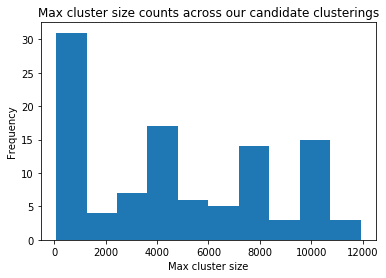

In [13]:
df_stats['max'].plot(kind='hist')
plt.xlabel("Max cluster size")
plt.title("Max cluster size counts across our candidate clusterings")

Let's restrict it to those with maximums under 500. 

Text(0.5, 1.0, 'Max cluster sizes under 500  across our candidate clusterings')

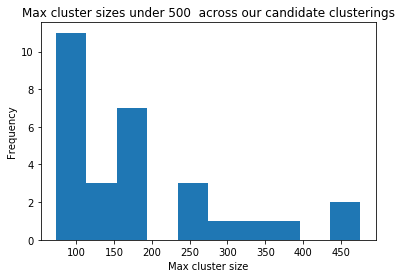

In [14]:
df_stats_small_max = df_stats[df_stats['max'] < 500]

df_stats_small_max['max'].plot(kind='hist')
plt.xlabel("Max cluster size")
plt.title("Max cluster sizes under 500  across our candidate clusterings")

Looks like we still have quite a few options.  We next want to minimize the outliers. Let's see how the outliers behave as we change our parameters one at a time. 

Text(0.5, 1.0, 'Outliers by minSamples with Epsilon of 50')

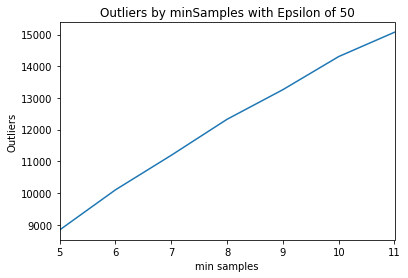

In [15]:
df_stats_small_max['outliers'][50].plot()
plt.xlabel("min samples")
plt.ylabel("Outliers")
plt.title("Outliers by minSamples with Epsilon of 50")

Text(0.5, 1.0, 'Outliers by Epsion with min samples of 7')

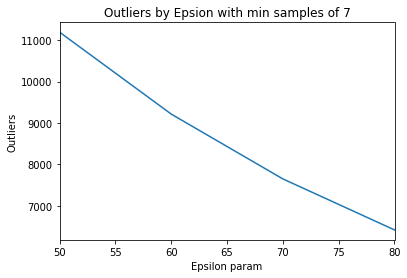

In [16]:
df_stats_small_max.loc[(slice(None), 7), "outliers"].droplevel(1).plot()
plt.xlabel("Epsilon param")
plt.ylabel("Outliers")
plt.title("Outliers by Epsion with min samples of 7")

So, we want a low minimum sample, and a high Epsilon. Let's look at our options.

Text(0.5, 1.0, 'Parameter Combos With a Max Cluster Under 500')

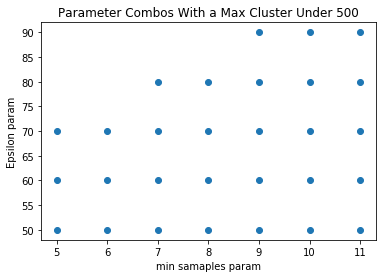

In [17]:
plt.scatter(df_stats_small_max.index.droplevel(0), df_stats_small_max.index.droplevel(1))
plt.xlabel("min samaples param")
plt.ylabel("Epsilon param")
plt.title("Parameter Combos With a Max Cluster Under 500")

Minimizing minimum samples, yet maximizing epsilon gives us 3 reasonable parameter pairs: (70, 5), (80, 7), and (90, 9). Let's look at their stats. 

In [18]:
df_stats.loc[[(70, 5), (80, 7), (90, 9)]]

,,count,mean,std,min,25%,50%,75%,max,outliers
epsilon,min_samples,,,,,,,,,
70,5,582.0,22.266323,32.630928,3.0,6.00,11.0,23.0,339.0,5738.0
80,7,406.0,30.238916,40.588627,4.0,9.00,16.0,33.0,363.0,6420.0
90,9,306.0,39.013072,55.355718,3.0,12.25,22.0,40.0,476.0,6759.0


(70, 5) has the lowest outliers, but (90, 9) has twice the median cluster size, yet reasonable low number of outliers. I suspect that in our category calculations, a larger median cluster size will mean more clusters will give us useful recommendations. So we choose epsilon = 90, and min_samples = 9. 

In [19]:
clusters = clusterings[(90, 9)]

In [20]:
clusters[clusters != -1].value_counts().describe()

count    306.000000
mean      39.013072
std       55.355718
min        3.000000
25%       12.250000
50%       22.000000
75%       40.000000
max      476.000000
dtype: float64

Let's take a look at the entire city. 

In [21]:
map_it(seattle_loc, 11, df, clusters, np.inf)

A close up on Downtown

In [22]:
map_it(seattle_loc, 14, df, clusters, 2000)

And a close up on the University District

In [23]:
University_of_Washington_loc = (47.660695, -122.312598)
map_it(University_of_Washington_loc, 14, df, clusters, 2000)

It all looks pretty reasonable. 

### Category Recommendation


### Formula
The mathematics behind the category recommendation is a little abstruse.  Where C is a category, Cl is a cluster, N(C, Cl) is the is the level of recommendation of that category in that cluster, v is a venue, L(v) is the number of likes of the venue, Cat(v) is the category of the venue, and R(Ca, Cb) is the level of recommendation of Cb by Ca, and Nc(v, C) is the number of venues in nextvenue of category C, then N(C, Cl) is calculated as follows. N(C, Cl) is zero if there already exists a venue of category C in Cl, otherwise it is. 



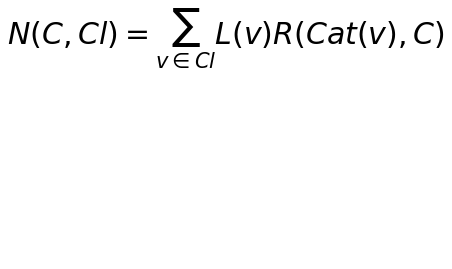

In [46]:
plt.text(0.0,1.0,"$N(C, Cl) = \sum_{v \in Cl} L(v)R(Cat(v), C)$", fontsize=30)
fig = plt.gca()
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)
fig.axes.set_frame_on(False)


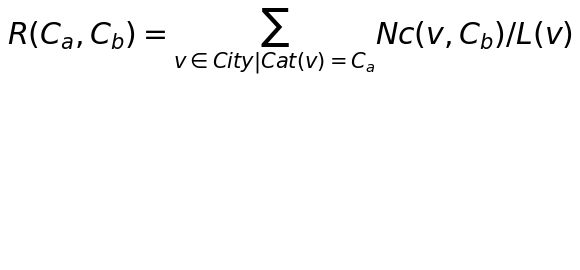

In [25]:
plt.text(0.0,1.0,"$R(C_{a}, C_{b}) = \sum_{v\in City| Cat(v) = C_{a}}Nc(v, C_{b})/L(v)$", fontsize=30)
fig = plt.gca()
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)
fig.axes.set_frame_on(False)

Now that we have our neighborhood clusters, we want to examine what categories are in each cluster, and from those deduce what categories of venue people will tend to want to go to after visiting venues in the cluster. For that we need a mapping from category to category indicating the pattern of customer flow.


First we get a set of all the categories, both those of venues in our dataframe, but also referenced as a next category. 

In [26]:
all_cats = {df["category id"][ind]:df["category name"][ind] for ind in df.index}
for venue in df.index:
    for next_cat in df["next categories"][venue]:
        all_cats[next_cat['id']] = next_cat['name']


We use this set to create a DataFrame with categories both as the index and the columns.  Each row represents a from category, and the columns represent a to category, and the value represents the likelihood of travel. We start off with the DataFrame zeroed out. 

In [27]:
df_cats = pd.DataFrame(all_cats.keys(), columns =["id"]).set_index('id')
for ident in df_cats.index:
    df_cats[ident] = np.zeros(len(df_cats)) 

In [28]:
df_cats.shape

(599, 599)

Now each venue votes in its own category for its next categories.  We then normalize so that each category gets the same weight in the cluster, no matter how many total venues are in that category. 

In [29]:
for venue in df.index:
    for next_cat in df["next categories"][venue]:
        df_cats.at[df["category id"][venue], next_cat['id']] += 1

        
df_cats = df_cats.apply(lambda x: x/x.sum() if x.sum() != 0 else x, axis='columns')

In [30]:
df_cats.describe()

,4bf58dd8d48988d16a941735,4bf58dd8d48988d14e941735,4e74f6cabd41c4836eac4c31,4bf58dd8d48988d174941735,4bf58dd8d48988d12d951735,4bf58dd8d48988d124941735,4bf58dd8d48988d130941735,52e81612bcbc57f1066b7a11,50be8ee891d4fa8dcc7199a7,52e81612bcbc57f1066b7a13,...,52e81612bcbc57f1066b7a28,58daa1558bbb0b01f18ec206,52e81612bcbc57f1066b79f4,4bf58dd8d48988d14d941735,4deefc054765f83613cdba6f,5bae9231bedf3950379f89d0,4f2a25ac4b909258e854f55f,52f2ab2ebcbc57f1066b8b19,4bf58dd8d48988d1e3931735,56aa371be4b08b9a8d573560
count,599.000000,599.000000,599.000000,599.0,599.000000,599.000000,599.000000,599.0,599.000000,599.0,...,599.0,599.0,599.000000,599.0,599.000000,599.000000,599.000000,599.000000,599.000000,599.000000
mean,0.008740,0.007485,0.001144,0.0,0.000211,0.000966,0.000444,0.0,0.015541,0.0,...,0.0,0.0,0.000185,0.0,0.000037,0.000070,0.000504,0.000023,0.000070,0.000848
std,0.033953,0.048722,0.014885,0.0,0.002139,0.012026,0.006033,0.0,0.043969,0.0,...,0.0,0.0,0.004540,0.0,0.000908,0.001265,0.005243,0.000552,0.001702,0.020431
min,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,0.500000,1.000000,0.333333,0.0,0.030303,0.250000,0.117647,0.0,0.500000,0.0,...,0.0,0.0,0.111111,0.0,0.022222,0.027027,0.090909,0.013514,0.041667,0.500000


Now that we know the aggregate destination category for each source category, we map that back to our venues, multiplying by the number of likes in the venues so that popular venues get weighted more. 

In [31]:
df_venue_cats =  (df_cats.loc[df['category id']].set_index(df.index)).mul(df['likes'], axis='index')

We add in the clusters from our clustering we chose above. 

In [32]:
df_venue_cats['cluster'] = clusters

We sum all the venues in each cluster. 

In [33]:
df_cluster_cats = df_venue_cats.groupby(by="cluster").sum()

Zero out the categories for venues in the cluster.  No reason to recommend a category already in the cluster. 

In [34]:

# Also include code to consolidate categories, and remove problematic categories.  These
# just might be useful later. 
def fix_cats(cluster_cats, problem_cats=[], category_map={}):
    ret = cluster_cats.copy()
    
    for source, dest in category_map.items():
        ret[dest] += ret[source]
        ret[source] = 0
    for cat in problem_cats:
        if cat in ret:
            ret[cat] = 0
    
    for venue_id in df.index:
        cat_id = df.at[venue_id, 'category id']
        effective_id = category_map[cat_id] if cat_id in category_map else cat_id
        ret.at[clusters[venue_id], effective_id] = 0.0
    
    return ret

In [35]:
df_cluster_cats_filtered = fix_cats(df_cluster_cats)

## Results

We now have our recommendations.  Let's get the top categories and see our recommendations on the map.

In [36]:
def count_values_in_top(df_cluster_cats, n=3):
    cat_counts = pd.Series(data=np.zeros(len(all_cats)), index=all_cats.values())
    cat_counts['No Recommendation'] = 0
    for cluster_id, all_recs in df_cluster_cats.iterrows():
        recs = top_recs(all_recs, n)
        if recs is None:
            cat_counts['No Recommendation'] += 1
        else:
            for rec in recs:
                cat_counts[rec] +=1
    return cat_counts.sort_values(ascending=False)


In [37]:
count_values_in_top(df_cluster_cats_filtered).head(10)

Supermarket       182.0
Grocery Store     152.0
Park              114.0
Coffee Shop       108.0
Ice Cream Shop     45.0
Market             40.0
Bar                36.0
Big Box Store      19.0
Pub                18.0
Brewery            18.0
dtype: float64

In [38]:
map_it(seattle_loc, 11, df, clusters, np.inf, df_cluster_cats = df_cluster_cats_filtered)

It seems we recommend a grocery store wherever there is a supermarket, and a supermarket wherever there is a grocery store.  We have some nearly synonymous categories. 

In [39]:
category_map = {"52f2ab2ebcbc57f1066b8b46": "4bf58dd8d48988d118951735", # Supermarket -> Grocery Store
                "52f2ab2ebcbc57f1066b8b42": "4bf58dd8d48988d118951735", # Big Box Store -> Grocery Store
                "52f2ab2ebcbc57f1066b8b45": "4bf58dd8d48988d118951735", # Organic Grocery -> Grocery Store
               }

In [40]:
df_cluster_cats_filtered2 = fix_cats(df_cluster_cats, category_map=category_map)
count_values_in_top(df_cluster_cats_filtered2).head(10)

Grocery Store     193.0
Park              132.0
Coffee Shop       114.0
Ice Cream Shop     66.0
Market             65.0
Bar                45.0
Movie Theater      26.0
Brewery            23.0
Burger Joint       18.0
Pub                18.0
dtype: float64

In [41]:
map_it(seattle_loc, 11, df, clusters, np.inf, df_cluster_cats = df_cluster_cats_filtered2)

We still have a few categories dominating. Some of these are dominating likely because of a small number of outlier venues.

In [42]:
df[df['likes'] > 700]

,name,category id,category name,lat,lng,likes,next categories
id,,,,,,,
44c14900f964a520b8351fe3,Uwajimaya,52f2ab2ebcbc57f1066b8b46,Supermarket,47.596855,-122.326864,723.0,"[{'id': '4bf58dd8d48988d114951735', 'name': 'B..."
4b155088f964a520beb023e3,T-Mobile Park,4bf58dd8d48988d18c941735,Baseball Stadium,47.590567,-122.333018,1736.0,"[{'id': '4bf58dd8d48988d184941735', 'name': 'S..."
43768200f964a5204d2a1fe3,CenturyLink Field,4bf58dd8d48988d184941735,Stadium,47.595856,-122.331921,2193.0,"[{'id': '4bf58dd8d48988d18c941735', 'name': 'B..."
4558a938f964a520493d1fe3,Kerry Park,4bf58dd8d48988d163941735,Park,47.629481,-122.359892,951.0,"[{'id': '4bf58dd8d48988d163941735', 'name': 'P..."
427ea800f964a520b1211fe3,Pike Place Market,50be8ee891d4fa8dcc7199a7,Market,47.609467,-122.341465,5077.0,"[{'id': '4bf58dd8d48988d1e0931735', 'name': 'C..."
416dc180f964a5209b1d1fe3,Space Needle,4bf58dd8d48988d12d941735,Monument / Landmark,47.620452,-122.349369,2198.0,"[{'id': '4bf58dd8d48988d165941735', 'name': 'S..."
440daad8f964a52096301fe3,Starbucks,4bf58dd8d48988d1e0931735,Coffee Shop,47.609988,-122.342626,1460.0,"[{'id': '50be8ee891d4fa8dcc7199a7', 'name': 'M..."
4f2334b8e4b0085e48b153c0,Chihuly Garden and Glass,4bf58dd8d48988d18f941735,Art Museum,47.620534,-122.350277,1283.0,"[{'id': '4bf58dd8d48988d12d941735', 'name': 'M..."
419a9480f964a520281e1fe3,Lola,4bf58dd8d48988d143941735,Breakfast Spot,47.613247,-122.339874,887.0,"[{'id': '50be8ee891d4fa8dcc7199a7', 'name': 'M..."


Pike Place Market, for instance, is such a large draw, that, no matter where you first check in downtown, there is a fair chance your next checkin will be Pike Place Market. The purpose of our is a recommender for new businesses on a neighborhood scale. If you were to create a market, I guarantee  it won't turn into the next Pike Place Market.  Effectively that one outlier datapoint ruined the entire category.  As we only save the "next categories" by venue, instead of the next venues, at this point it isn't an easy fix.  For now, let's drop the entire Market Category, as well as Stadium, Baseball Stadium, Monument/Landmark, Museum, Art Museum, Ice Cream Shop, and Coffee Shop.  Our recommender engine also tends to suggest Grocery Store wherever there isn't already one. Though those are useful, those locations are easy to figure out without our recommender engine, so let's drop that as well.  Parks and Beaches aren't really useful recommendations either, so let's drop those.  

In [43]:
problem_cats = ['4bf58dd8d48988d118951735', '4bf58dd8d48988d1e2941735', 
                '50be8ee891d4fa8dcc7199a7', '4bf58dd8d48988d163941735', 
                '4bf58dd8d48988d1e0931735', '4bf58dd8d48988d18c941735', 
                '4bf58dd8d48988d184941735', '4bf58dd8d48988d12d941735', 
                '4bf58dd8d48988d18f941735', '4bf58dd8d48988d181941735', '4bf58dd8d48988d1c9941735']

df_cluster_cats_filtered3 = fix_cats(df_cluster_cats,category_map=category_map, problem_cats=problem_cats)
count_values_in_top(df_cluster_cats_filtered3).head(10)


Bar                92.0
Brewery            66.0
Movie Theater      58.0
Pub                48.0
Bakery             46.0
Pharmacy           43.0
Burger Joint       42.0
Dive Bar           34.0
Hardware Store     30.0
Bubble Tea Shop    27.0
dtype: float64

In [44]:
map_it(seattle_loc, 11, df, clusters, np.inf, df_cluster_cats = df_cluster_cats_filtered3)

This can be further refined, but I suspect the need for manual refinement just exposes limitations on the general approach and dataset.

In [45]:
map_it(University_of_Washington_loc, 14, df, clusters, 2000, df_cluster_cats = df_cluster_cats_filtered3)

## Discusion
This model has several issues.  First, the model clusters directly on geographical density.  The clusters are supposed to represent neighborhoods.  Easy travel between business is the useful defining aspect for neighborhoods.  Distance as the crow flies isn’t a true gauge of that. Different neighborhoods have different natural transportation methods.  A car centric neighborhood might be more spread out than one that caters to pedestrians.  We would need to use a much more intelligent metric in our DBSCAN to rectify that. 

Also our clustering has strict membership.  As far as our algorithm is concerned, reasonably nearby venues that are outside the cluster might as well not exist. This is especially problematic for categories where venues tend to serve a larger area.  A coffee shop on every corner might be necessary (in Seattle anyway), but supermarkets, to say nothing of theme parks, probably can be spread out more.  The model also errs on the assumption that one shop of a given type necessarily fills a given void.  Often in reality, it is useful for similar shops to be clustered together.  Those customers drawn in by one, yet leaving unsatisfied will head to the other.  

The data also has issues. “Category” as presented by Foursquare is sometimes to specific for our uses, as, for instance, each cuisine has its own restaurant category, and our algorithm as has no method for neighboring categories to bleed into each other.  We already merged Grocery Store with its near neighbors, but that was just the most impactful of several problematic category groups. 

The model deduces the next category from Foursquares nextvenue call, and tries to generalize a category to category map.  This is highly problematic for a few reasons.  First, it makes the assumption that the reason one venue is visited after another is because of the categories of the venues.  This is often no the case.  As mentioned above, some venues have such draw that the likelihood of it being one of the top next venues after any given venue is pretty high.  This can greatly skew the map.  The nextvenue list only has the top 5 venues.  This biases the algorithm to categories with specific venues that are a top draw, rather that categories which in aggregate are a top draw. Also some categories have very few venues.  In the creation of the category to category map, we assume the effect of geographical proximity will average out, but this isn’t the case when a category has very few venues.   This means the recommendations for a cluster with several venues relatively unique in their category will tend to be biased toward the categories of venues just outside the cluster.  For instance, a cluster representing a piece University of Washington has the recommendation of Student Center, Fountain, and College Cafeteria, all categories of venues just outside the cluster.   

The model uses the number of likes to stand in for traffic. This biases our model toward giving weight to older venues, venues well liked, and venues of a type that people would like them on a Foursqure app.

Finally, there is the general problem of the data, that it is generated by user activity. This biases the model toward the behavior of those actively using the app.  The users tend towards the young and towards people of color, and men. https://brandongaille.com/26-great-foursquare-demographics/.  I also suspect that people use Foursquare more actively when travelling. 

## Conclusion

With the many problems with the model, it likely has limited utility, perhaps as a starting point in one investigations into opening a business.  However, much investigation would have to be done to validate any of the recommendations, as such they shouldn’t be relied upon. 

